### The race to the electric car
### This is a data Analysis using electric vehicle data in the state of washington USA shared online in https://catalog.data.gov/dataset/electric-vehicle-population-data

In [1]:
import plotly.express as px
import numpy as np
import pandas as pd
from pathlib import Path
import plotly.graph_objects as go
import os
import matplotlib.pyplot as plt


In [2]:
data = pd.read_excel('Electric_Vehicle_Population_Data.xlsx')

In [3]:
print(data.columns)

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')


##### Dropping rows with nan in the most relevant subset of columns to be used in our analysis

In [4]:
data = data.dropna(subset = ['Electric Range','County', 'City', 'Model', 'Make'])

#### The question: Which makers are dominant in  the Market?

In [5]:
# Plotly version
fig = px.histogram(data, x = 'Make').update_xaxes(categoryorder = 'total descending')
fig.update_layout(title = {'text': 'Dominant vehicle Makers in the market', 'x': 0.5, 'xanchor': 'center'})
fig.show()

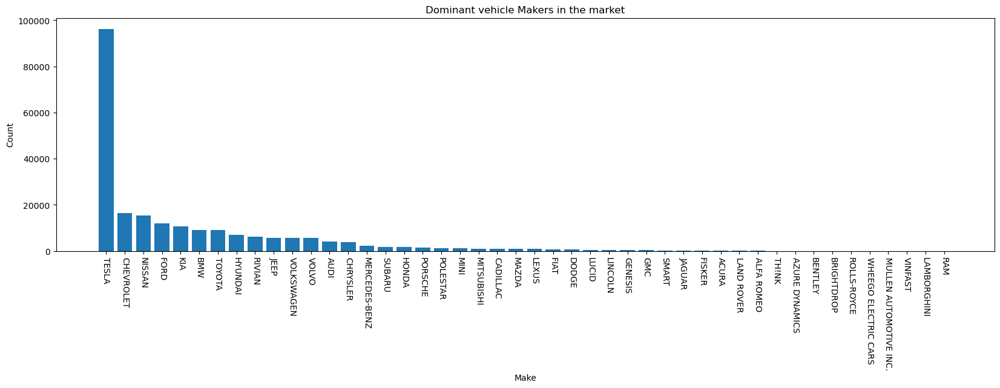

In [6]:
# Matplotlib version
from collections import Counter

# Count occurrences of each category
counts = Counter(data['Make'])
# Sort categories by count in descending order
sorted_categories = sorted(counts.keys(), key=lambda x: counts[x], reverse=True)
sorted_counts = [counts[cat] for cat in sorted_categories]

fig = plt.figure(figsize=(20,5))
# Plot the sorted histogram
plt.bar(sorted_categories, sorted_counts)
plt.xlabel("Make")
plt.xticks(rotation = -90)
plt.ylabel("Count")
plt.title("Dominant vehicle Makers in the market")
plt.show()

##### From the above plot, we can see that Tesla is dominant in the Market by extremely large difference with its successor Chevrolet
##### After Tesla, we find a first portion of Vehicle Makers that are on a similar level approximately which are: Chevrolet, Nissan, Fors, Kia, BMW, Toyota, Hyundai, Rivian, Jeep, Volswagen, Volvo.
##### The seconf part of the portion of vehicles are non dominant in the market.

### The question: Which car models are dominant (in demand) in the market?

In [8]:
# Global disctribution of the models of the most dominant car Makers (with more than 5000 cars registered)
count = data['Make'].value_counts() > 5000

fig = px.histogram(data[data['Make'].isin(count[count==True].index.values)], x = 'Model', color = 'Make',
                   color_discrete_sequence=px.colors.qualitative.Set3).update_xaxes(categoryorder = 'total descending')
fig.update_layout(title = {'text': 'Dominant Models in the market', 'x': 0.5, 'xanchor': 'center'})
fig.show()

##### From the above plot, we can see that The Tesla have the most number of its models in the leading with 2 of its models in the 1st and 2nd position, followed by another model in the 4th position, and another model in the 6th position.
##### Whithin the list of car makers that compete with Tesla, we find Nissan and Chevrolet with each a car model in the leading positions, one at the 3rd position (Nissan) and one at the 6th position (Chevrolet) 

### The question: What is the proportion of Car maker in the market along with their most sold model of cars

In [ ]:
# path paramater should take the parent first of the path, which will appear in the center of the pie
# The 1st child of the parent will appear in the 1st layer of the pie, and the 2nd child will appear in the 2nd layer, and so on
fig = px.sunburst(data, 
                  path = ['Make', 'Model'])
fig.update_layout(width = 800, height = 800, title = {'text': 'Proportion of each vehicle Make along with their models',
                                                      'x': 0.5, 'xanchor': 'center'})
fig.show()

##### The above plot is an overview of the global distribution of the car makers along with their models.
##### The plot is an alternative to its previous 2 plots where one plot the dominant Car Makers in the market and another plot the dominant cars Models.

### The question: What is the proportion of vehicles eligibility as clean alternative Fuel

In [ ]:
from sklearn.preprocessing import LabelEncoder

data_column = data['Clean Alternative Fuel Vehicle (CAFV) Eligibility']

encoder = LabelEncoder()

encoded_data = pd.DataFrame(encoder.fit_transform(data_column)+1, columns = ['Clean Alternative Fuel Vehicle (CAFV) Eligibility'])

electric_range = data.groupby('Clean Alternative Fuel Vehicle (CAFV) Eligibility').agg(
    count = ('Electric Range', 'count'), min_value = ('Electric Range', 'min'), max_value = ('Electric Range', 'max'))

electric_range['hover_text'] = electric_range.apply(
    lambda row: f"Min: {row['min_value']}<br>Max: {row['max_value']}",
    axis=1
)

fig = go.Figure(
    data=[
        go.Pie(
            labels=electric_range.index,
            values=electric_range['count'],
            textfont_size=20,
            hovertext=electric_range['hover_text']
        )
    ]
)
fig.update_layout(width = 1000, height = 600,
                  title = {'text': 'Proportion of eligibility as clean Alternative Fuel vehicle', 'x': 0.5, 'xanchor': 'center'})
fig.show()

##### From the above plot analysis for the eligibility of vehicles as clean alternative fuel, we can see that more than half the vehicles in the database have an unkown eligibility at the time.
##### The other part of the data is divided into majority (~32%) being clean alternative Fuel Vehicle eligible, and the minority (~10%) as not eligible to clean alternative Fuel Vehicle.

### The question: What is the distribution of the Clean alternative Fuel vehicle eligibility by Maker and Model?

In [ ]:
# We represent eligible vehicles with green, non eligible with red, and unkown with grey.
cafv_colors = {
    'Not eligible due to low battery range': 'red',  
    'Clean Alternative Fuel Vehicle Eligible': 'green',   
    'Eligibility unknown as battery range has not been researched': 'grey'
}
# path paramater should take the parent first of the path, which will appear in the center of the pie
# The 1st child of the parent will appear in the 1st layer of the pie, and the 2nd child will appear in the 2nd layer, and so on
fig = px.sunburst(data, 
                  path = ['Make', 'Model', 'Clean Alternative Fuel Vehicle (CAFV) Eligibility'],
                  color='Clean Alternative Fuel Vehicle (CAFV) Eligibility',
                  color_discrete_map=cafv_colors)
fig.update_layout(showlegend = True, legend_title=dict(text="CAFV Eligibility"), #legend_title = 'Clean Alternative Fuel Vehicle (CAFV) Eligibility',
                  title = {'text': 'Proportion of Eligibility as clean alternative by Make and Model', 'x': 0.5, 'xanchor': 'center'},
                  width = 1000, height = 800, )
fig.show()

##### From the above plot we can see straight away that the majority of the Tesla vehicles have an unkown eligibility of clean alternative due to the battery range not yet researched.
##### What we notice from the above plot:
##### - The 3 leaders in the market (Tesla, Chevrolet, and Nissan) do not have any of their models as non eligible to clean alternative.
##### - The car makers with all their vehicles being eligible (in green) to clean alternative are: CHRYSLER, DODGE (very few models)
##### - The car maker JEEP with all its models being non eligible (in red) to clean alternative.


### The question: What differenciate the eligible from the non eligible in terms of electric range

In [ ]:
# Does newer car comes with improved or efficient electric range?
colors = {
    'Clean Alternative Fuel Vehicle Eligible': 'green',
    'Not eligible due to low battery range': 'red'
}

# Lets eliminate first the eligibility unkown from the dataset
eligibility_known = data[data['Clean Alternative Fuel Vehicle (CAFV) Eligibility']!='Eligibility unknown as battery range has not been researched']

fig = px.scatter(eligibility_known, x = 'Model Year', y = 'Electric Range', 
                 color = 'Clean Alternative Fuel Vehicle (CAFV) Eligibility',
                 color_discrete_map= colors)
fig.update_layout(title = {'text': 'Electric range of eligible and non eligible clean alternative fuel vehicle', 'x': 0.5, 'xanchor': 'center'})
fig.show()

##### From the above plot we can see that the non eligible to clean alternative fuel vehicle are the vehicles with electric range below 30 (We can zoom in the plot to see it better at the ~30 range)
##### The vehicles with eligible clean alternative fuel are the ones with electric range superior to 30


### For now we identified the leaders as the car makers with the dominant registered cars and they have been also the ones with none of their models classified as not eligible to clean alternative fuel.
### The question: Which models/car makers have the highest margin of electric range.

In [ ]:
# We should take the data with models eligible
eligible = data[data['Clean Alternative Fuel Vehicle (CAFV) Eligibility'] == 'Clean Alternative Fuel Vehicle Eligible']

fig = px.scatter(eligible, x = 'Model Year', y = 'Electric Range', color = 'Make', 
                 color_discrete_sequence=px.colors.qualitative.Set3)
fig.update_layout(height = 1000, width = 1000 ,
                  title = {'text': 'Electric range of eligible clean alternative fuel vehicle', 'x': 0.5,
                           'xanchor': 'center'})
fig.show()

##### From the above plot we can see that :
##### - Tesla is noticeably the leader in terms of majority of its vehicles in the top part of the electric range (200 and above). 
##### - There is Porche present in the top part as well of the electric range with just 2 of its vehicles from the same year model 2024.
##### - In the early years before 2008 we see only Toyota and Ford present in the market. Later from 2008, Tesla started appearing with electric range of 220, and in most of the following years its vehicles were the leaders in terms of the electric range.

### The question: Geographically in washignton, is there countries with noticeable present of electric vehicles (which may indicate better infrastructure for electric vehicles maybe)

In [ ]:
fig = px.histogram(data, x='County').update_xaxes(categoryorder = 'total descending')
fig.update_layout(title = {'text': 'The distribution of Countries with Electric vehicles', 'x': 0.5, 'xanchor': 'center'},
                  width = 1100, height = 600)
fig.show()

##### From the above plot, we can see that the country King have the most electric vehicles, followed by Thurston, Benton, Chelan.